In [1]:
import matplotlib.pyplot as plt

from utils import data_loader
from utils import model

import os
import sys
import pathlib

import numpy as np

from tqdm import tqdm
from skimage.io import imread
from skimage.transform import resize
from skimage.segmentation import expand_labels
from scipy.ndimage import gaussian_filter
from skimage import measure

from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
import tensorflow as tf
from PIL import Image
from utils.heat_map import HeatMap
config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

2022-12-03 15:29:55.329324: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
/home/lbbduy/anaconda3/envs/master_python/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2022-12-03 15:29:55.870558: I tensorflow/compiler/jit/xla_gpu_device.cc:99] Not creating XLA devices, tf_xla_enable_xla_devices not set
2022-12-03 15:29:55.870998: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2022-12-03 15:29:55.897976: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-03 15:29:55.898365: I tensorflow/core/common_runtime/gpu/gpu_device.cc:172

In [23]:
BATCH_SIZE = 1
BATCH_SAMPLE_SIZE = 64

dataset_dict = data_loader.load_dataset_paths(dataset_name='final_data', validation_split_size=0.0)

test_input_data = dataset_dict['train']['images']
test_output_data = dataset_dict['train']['density_maps']

test_dataset, test_size = data_loader.load_dataset(
    input_paths=test_input_data,
    output_paths=test_output_data,
    output_type='density_maps',
    batch_size=BATCH_SIZE,
    shuffle=True,
    downsampling_size=8,
    buffer_size=1
)

In [3]:
test_size

1260

9.999997


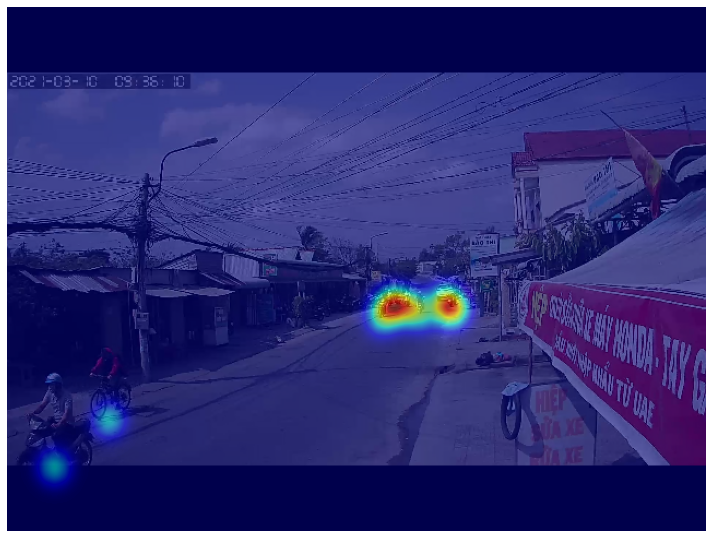

4.999999


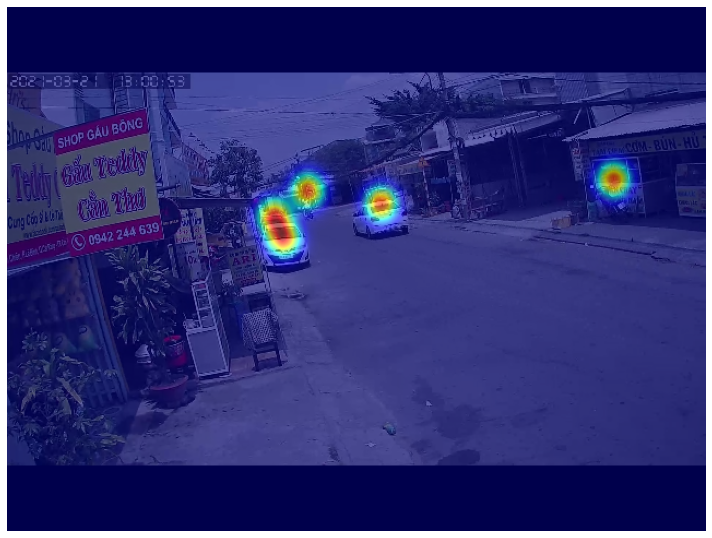

17.994652


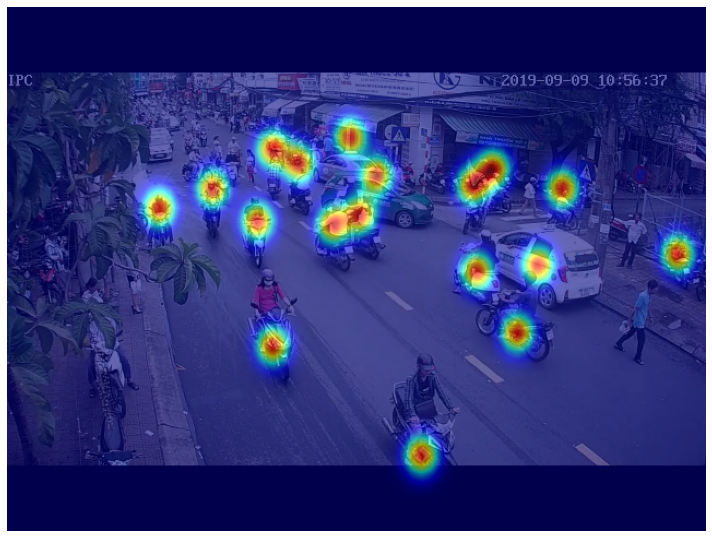

11.999958


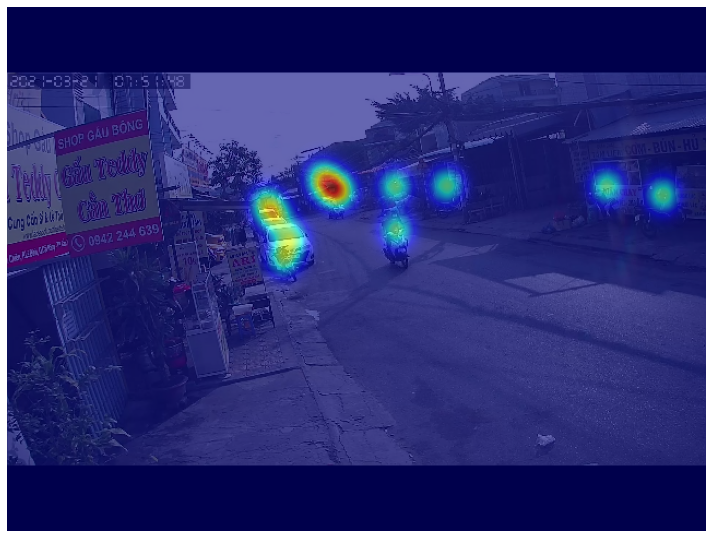

6.0000005


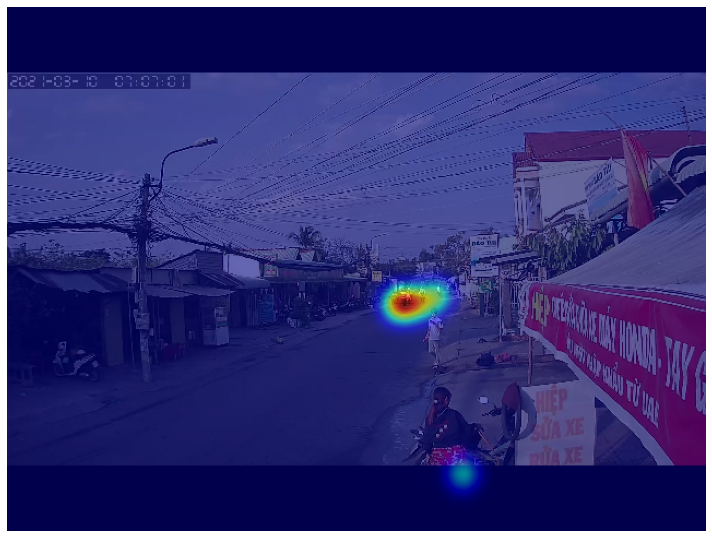

15.997054


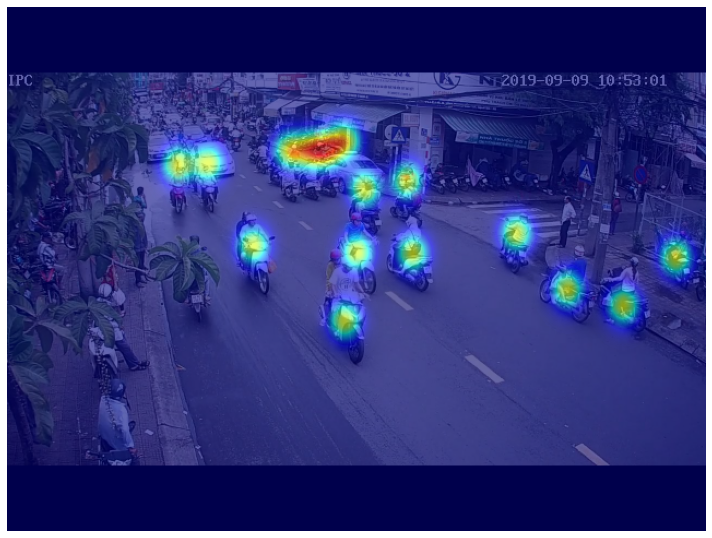

6.9970555


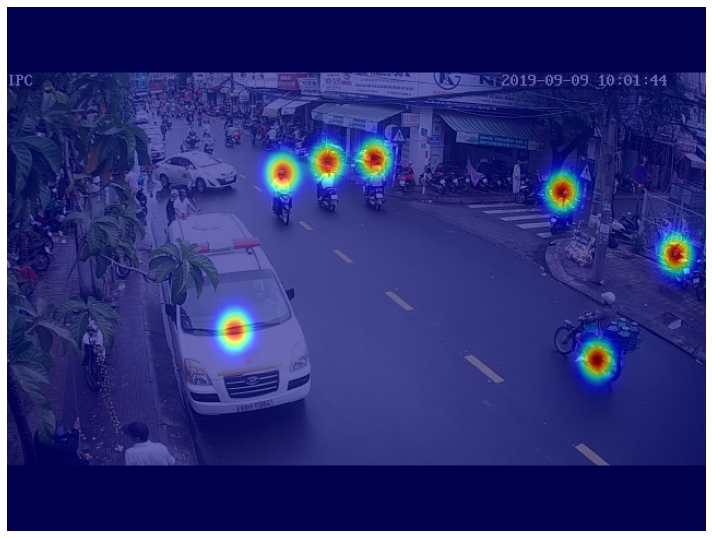

12.994656


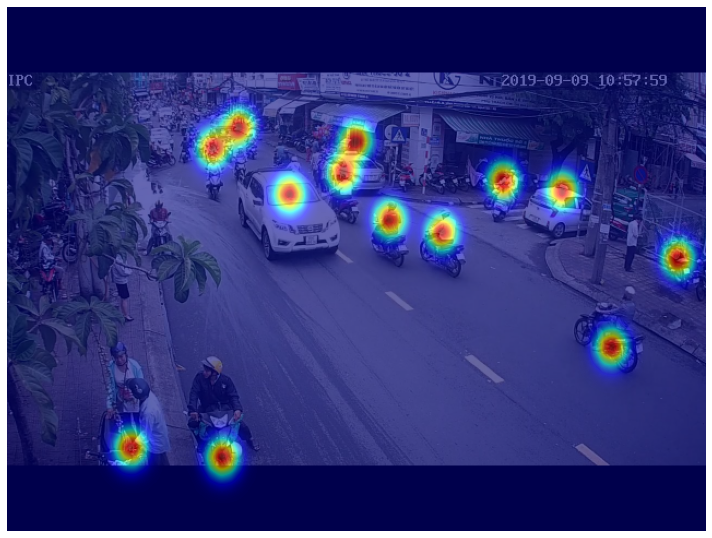

6.0


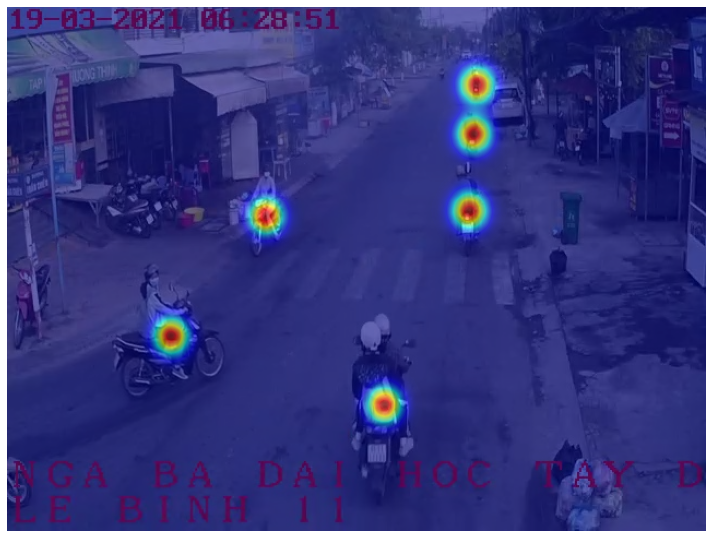

7.9929028


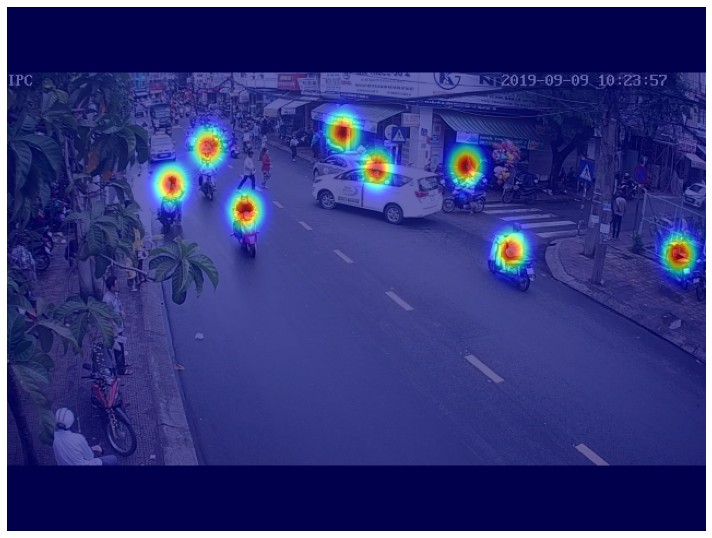

In [24]:
for a, b in test_dataset.take(10):
    image = a.numpy()
    image = (image * 255).astype(np.uint8)
    mask = b.numpy()
    print(np.sum(mask))

    hm = HeatMap(image[0] , mask[0], gaussian_std=0)
    hm.plot(transparency=0.6, color_map='jet', figure_size=(10,30))

    # plt.figure(figsize=(30, 15))
    # plt.imshow(img[0] * 255.0)
    # plt.show()
    #
    # plt.figure(figsize=(30, 15))
    # plt.imshow(mask[0], cmap='jet')
    # plt.show()

In [13]:
model_pretrained = model.load_pretrained_model('./model_checkpoints/model_CSRNet_checkpoint_12_01_2022_194000.h5')

In [41]:
image = data_loader.load_image('./examples/Image4812.jpg')
image = tf.expand_dims(image, axis=0)
mask = model_pretrained.predict(image)
# mask = res['density_map'][0].astype(np.float32)
# pred_count = mask['estimation']

12.235785


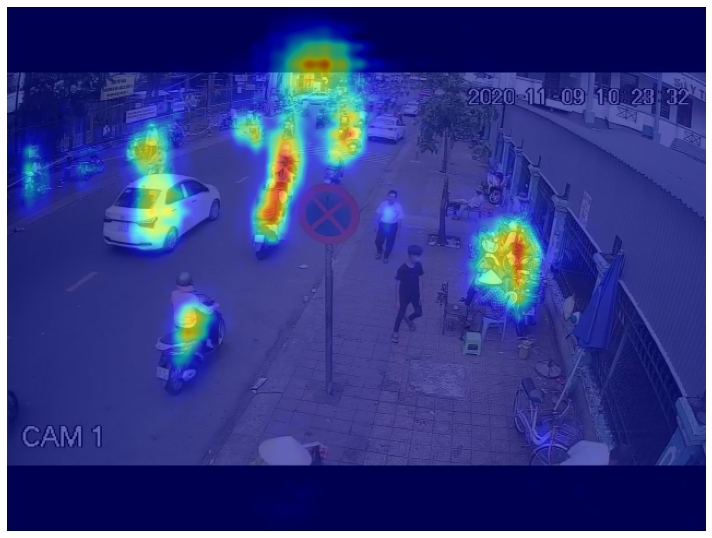

10.699282


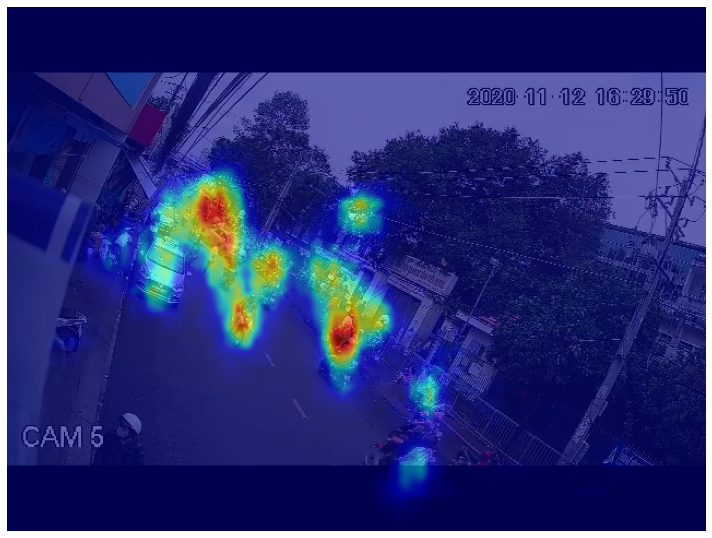

13.061199


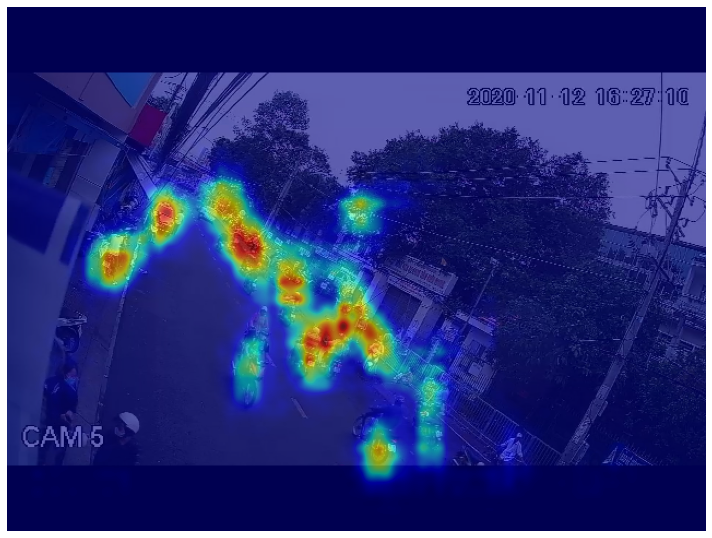

13.044469


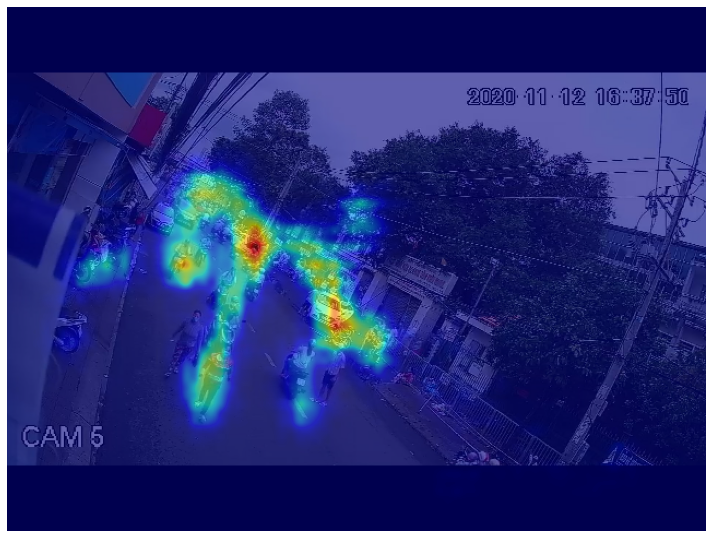

In [17]:
for image, density_map in test_dataset.take(4):
    img_plot = image.numpy()
    img_plot = (img_plot * 255).astype(np.uint8)

    pred_density_map = model_pretrained.predict(image)

    print(np.sum(pred_density_map))
    hm = HeatMap(img_plot[0] , pred_density_map[0], gaussian_std=0)
    hm.plot(transparency=0.6, color_map='jet')

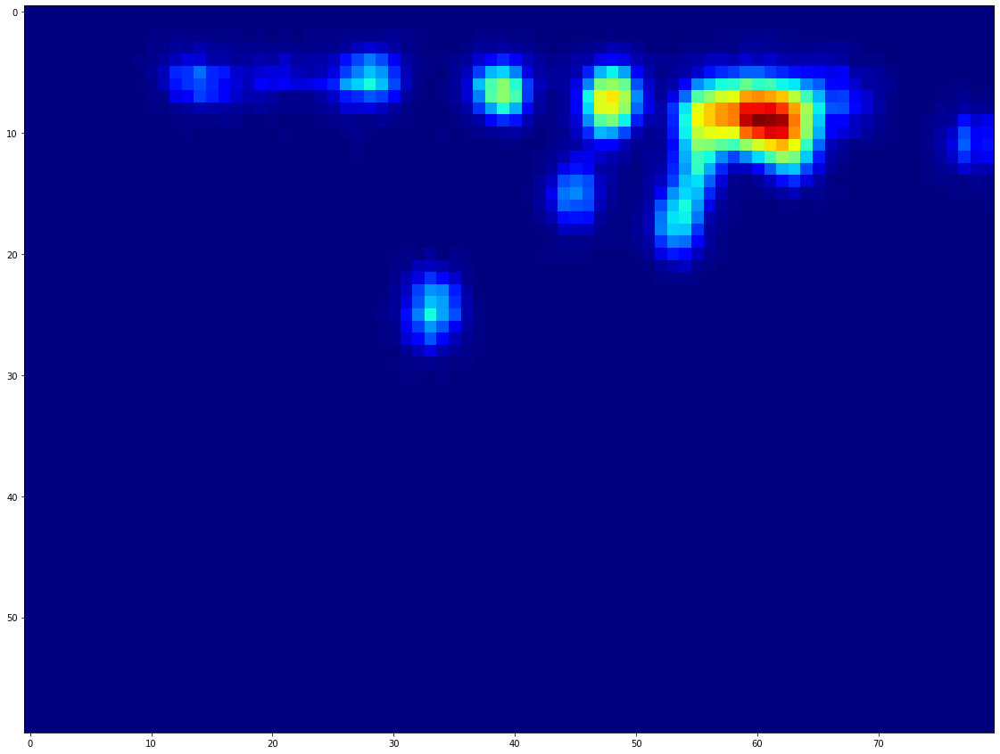

In [42]:
plt.figure(figsize=(30, 15))
plt.imshow(mask[0], cmap='jet')
plt.show()

In [26]:
img_test = data_loader.load_image('/home/lbbduy/Documents/Master_Final/datasets/kiengiang_dataset/test/images/video9_00060.jpg')
binary_mask = data_loader.load_image('/home/lbbduy/Documents/Master_Final/datasets/kiengiang_dataset/test_set_2/masks/video9_00060.png')
test_mask = np.load('/home/lbbduy/Documents/Master_Final/datasets/kiengiang_dataset/test/density_maps/video9_00060.npy')
img_test = img_test.numpy()
img_test = (img_test * 255).astype(np.uint8)

In [7]:
test_mask.shape

(480, 640, 1)

In [8]:
img_test.shape

(480, 640, 3)

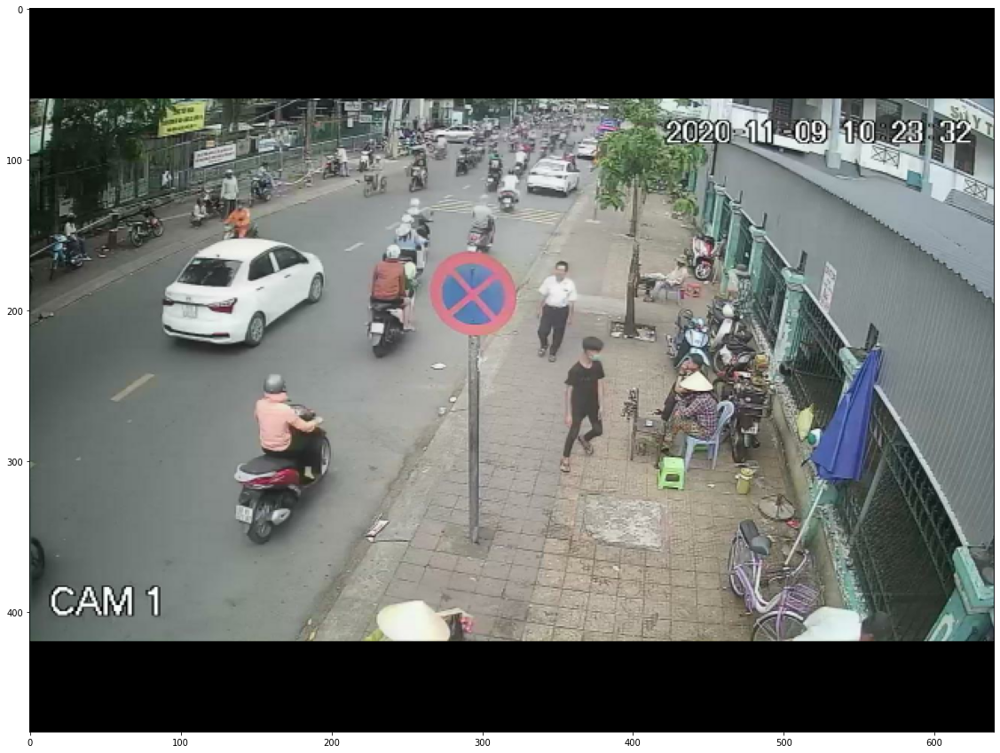

In [20]:
plt.figure(figsize=(30, 15))
plt.imshow(img_test)
plt.show()

In [ ]:
plt.figure(figsize=(30, 15))
plt.imshow(binary_mask)
plt.show()

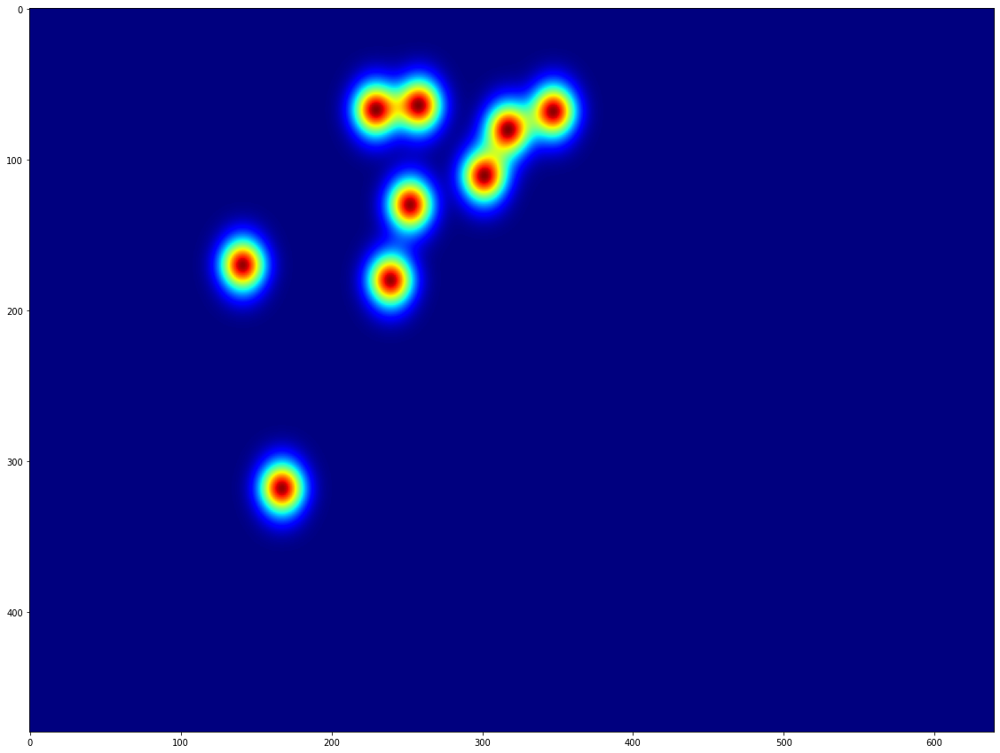

In [10]:
plt.figure(figsize=(30, 15))
plt.imshow(img_test)
plt.imshow(test_mask, cmap='jet')
plt.show()

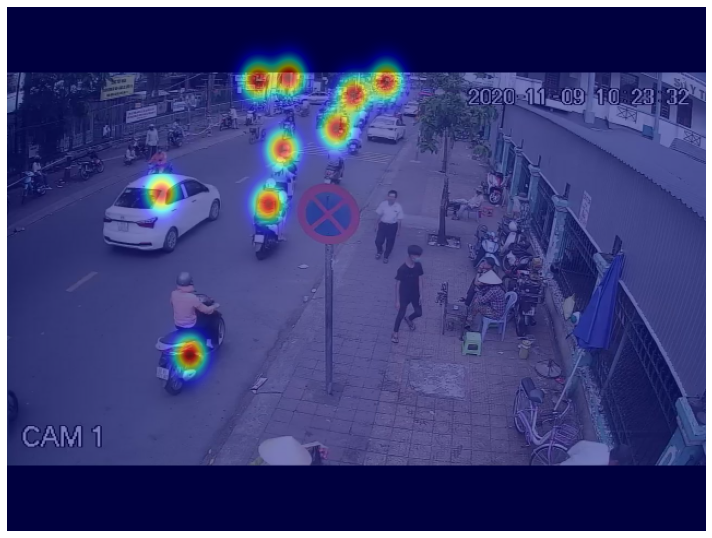

In [11]:
hm = HeatMap(img_test, test_mask, gaussian_std=0)
hm.plot(transparency=0.5, color_map='jet')

In [43]:
np.sum(mask)

16.977674

In [44]:
image = image.numpy() * 255
image = image.astype(np.uint8)

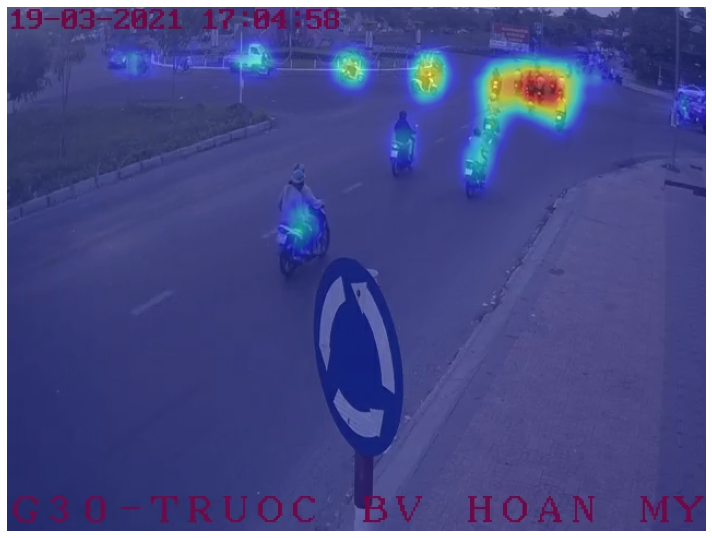

In [45]:
hm = HeatMap(image[0], mask[0], gaussian_std=0)
hm.plot(transparency=0.5, color_map='jet')